In [1]:
# import of necessary files from other folders

import os
import sys
import ast

# libraries imports

import importlib
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import seaborn as sns
import pandas as pd
import pickle

from IPython.display import Image, display
from PIL import Image
from pathlib import Path
from scipy.integrate import solve_ivp
from matplotlib.colors import LinearSegmentedColormap,TwoSlopeNorm

# Set default figure and axes background color to white
plt.rcParams['figure.facecolor'] = 'white'  # Background for the entire figure
plt.rcParams['axes.facecolor'] = 'white' 

# Function to check if a string can be converted to a float or an integer
def is_number(value):
    try:
        float(value)
        return True
    except ValueError:
        return False

## Importing dataframe

In [4]:
df_complete = pd.read_pickle('path to aux_F_sr.pkl')

547

## Visualize

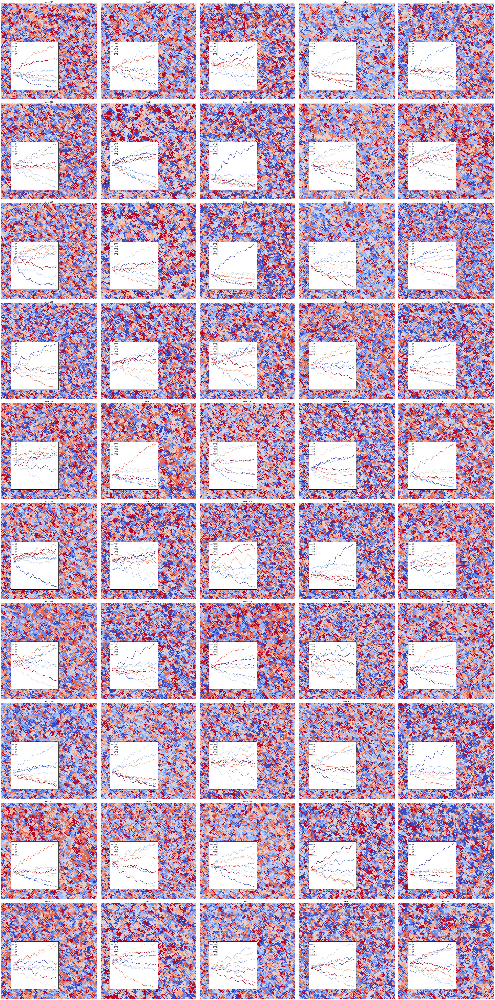

In [5]:
from matplotlib.colors import ListedColormap
import random

# Choose 50 random indices
np.random.seed(42)
indexes_random = random.sample(list(df_complete.index), 50)

# Define the layout of subplots
n_rows = 10  # 10 rows
n_cols = 5   # 5 columns

# Create a figure for all subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(40, 80))  # Adjust size as needed

# Define colormap
cmap = plt.cm.coolwarm

# Loop through each subplot
for idx, ax in zip(indexes_random, axes.flatten()):
    # Example data for the current index
    grid_data = np.argmax(df_complete['grid_sp_F'].iloc[idx], axis=2)  # Replace with actual data
    sp_f_data = np.array(df_complete['N_sp_F'].iloc[idx]) 

    num_classes = np.unique(grid_data).size  # Number of unique values in the grid
    local_cmap = ListedColormap(cmap(np.linspace(0, 1, num_classes)))

    # Grid visualization (imshow)
    ax.imshow(grid_data, cmap=local_cmap, interpolation='none')
    ax.set_title(f"Index {idx}", fontsize=10)
    ax.axis('off')  # Turn off axis for clarity

    # Add species fraction line plot
    inset_ax = ax.inset_axes([0.1, 0.1, 0.5, 0.5])  # Add an inset for the line plot
    for i in range(num_classes):
        inset_ax.plot(sp_f_data[:, i], label=f"Class {i}", color=local_cmap(i))
    inset_ax.legend(fontsize=6, loc="upper left")

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

In [6]:

# Extract the matrices for time_series and LV_traj
cr_matrices = [df_complete['CR_N_F'].iloc[i][0]/(np.sum(df_complete['CR_N_F'].iloc[i][0],axis=1))[:,np.newaxis] for i in indexes_random]
lv_matrices = [df_complete['C_F'].iloc[i] for i in indexes_random]
sp_matrices = [df_complete['N_sp_F'].iloc[i] for i in indexes_random]

# Create a figure with subplots for each of the matrices (10 rows, 10 columns)
fig, axes = plt.subplots(10, 15, figsize=(100, 90))  # Adjusted figsize for more columns

# Loop over the axes and the matrices to plot
for idx, (ax_sp, ax_cr, ax_up) in enumerate(zip(axes.flatten()[::3], axes.flatten()[1::3], axes.flatten()[2::3])):
    
    # Get the colors for each species based on the index
    species_colors_time_series = plt.cm.Set2.colors[:8]

    # Plot sp_matrices on the left subplots (odd indices)
    for i, color in enumerate(species_colors_time_series):
        ax_sp.plot(np.array(sp_matrices[idx])[:, i], color=color, label=f'Species {i + 1}')
    ax_sp.set_title(f'sp {idx + 1}')
    ax_sp.axis('on')  # Show axis for sp plot

    # Plot cr_matrices on the right subplots (even indices)
    for i, color in enumerate(species_colors_time_series):
        ax_cr.plot(np.array(cr_matrices[idx])[:, i], color=color, label=f'Species {i + 1}')
    ax_cr.set_title(f'CR_N {idx + 1}')
    ax_cr.axis('on')  # Show axis for cr plot

    for i, color in enumerate(species_colors_time_series):
        ax_up.imshow(lv_matrices[idx])
    ax_up.set_title(f'up {idx + 1}')
    ax_up.axis('on')  # Show axis for cr plot

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

/tmp/ipykernel_958690/1170045638.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_0_2 = leakage_0_2.groupby(['n_consumed', 'n_produced'], group_keys=False)\
/tmp/ipykernel_958690/1170045638.py:18: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_0_8 = leakage_0_8.groupby(['n_consumed', 'n_produced'], group_keys=False)\


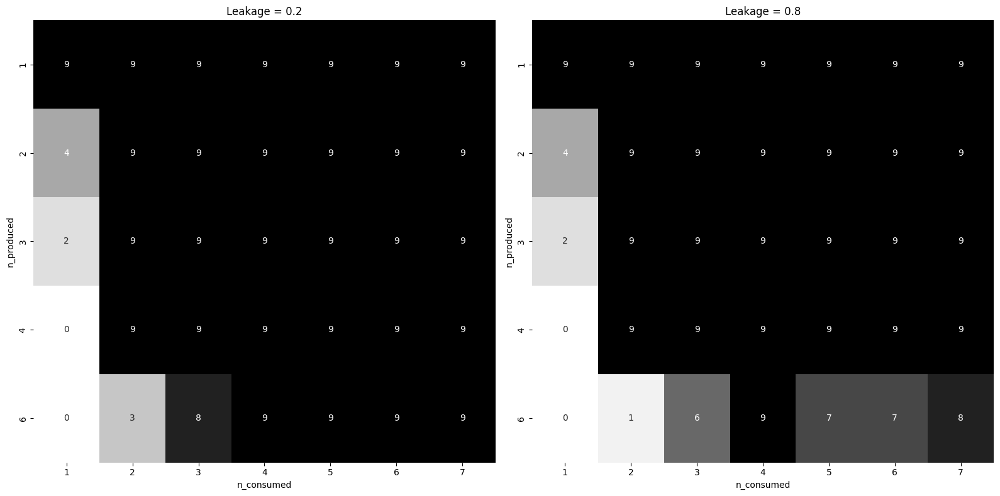

In [ ]:

# Separate the data by leakage
leakage_0_2 = df_complete[df_complete['l'] == 0.2]
leakage_0_8 = df_complete[df_complete['l'] == 0.8]

# Define the target size per group
target_size = 300  # Half of 500 networks
unique_combinations = leakage_0_2.groupby(['n_consumed', 'n_produced']).size()

# Calculate the sample size per group
sample_per_group_0_2 = target_size // len(unique_combinations)
sample_per_group_0_8 = target_size // len(unique_combinations)

# Sample data for leakage = 0.2
sampled_0_2 = leakage_0_2.groupby(['n_consumed', 'n_produced'], group_keys=False)\
    .apply(lambda x: x.sample(min(len(x), sample_per_group_0_2), random_state=42))

# Sample data for leakage = 0.8
sampled_0_8 = leakage_0_8.groupby(['n_consumed', 'n_produced'], group_keys=False)\
    .apply(lambda x: x.sample(min(len(x), sample_per_group_0_8), random_state=42))

# Combine the subsampled data
sampled_data = pd.concat([sampled_0_2, sampled_0_8])

# Verify counts for both leakage values
counts_0_2 = sampled_0_2.groupby(['n_consumed', 'n_produced']).size().unstack(fill_value=0)
counts_0_8 = sampled_0_8.groupby(['n_consumed', 'n_produced']).size().unstack(fill_value=0)

# Plot the counts as tables
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Table for leakage = 0.2
sns.heatmap(counts_0_2, ax=axes[0], annot=True, fmt='d', cmap='Greys', cbar=False)
axes[0].set_title('Leakage = 0.2')
axes[0].set_xlabel('n_consumed')
axes[0].set_ylabel('n_produced')

# Table for leakage = 0.8
sns.heatmap(counts_0_8, ax=axes[1], annot=True, fmt='d', cmap='Greys', cbar=False)
axes[1].set_title('Leakage = 0.8')
axes[1].set_xlabel('n_consumed')
axes[1].set_ylabel('n_produced')

plt.tight_layout()
plt.show()

In [8]:
from scipy.stats import entropy

# Apply the function to compute Shannon diversity and add it as a new column
sampled_data['shannon_F'] = sampled_data['sh_sp_F'].apply(lambda x: x[-1])

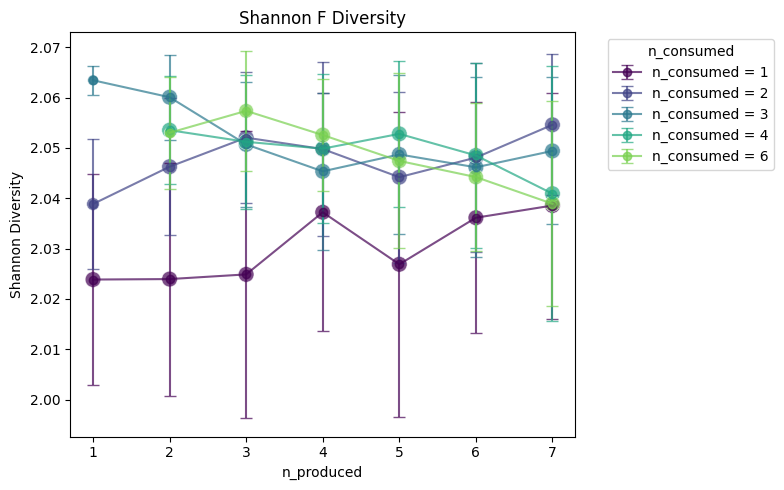

In [9]:
import matplotlib.colors as mcolors

# Assuming df_filtered is your DataFrame containing the data
unique_n_consumed = sampled_data['n_consumed'].unique()

# Sort the 'n_consumed' values so colors are assigned in increasing order
unique_n_consumed = np.sort(unique_n_consumed)

# Set up the figure with two subplots (one for Shannon F, one for Shannon O)
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(8, 5), sharex=True, sharey=True)

# Define a discrete version of the 'viridis' colormap with enough distinct colors
n_colors = len(unique_n_consumed)
cmap = plt.cm.viridis  # Use 'viridis' colormap
colors = [cmap(i / n_colors) for i in range(n_colors)]  # Discretize the colormap

# Loop through each unique 'n_consumed' and plot data for Shannon F and Shannon O
for i, n_cons in enumerate(unique_n_consumed):
    # Filter data for the current 'n_consumed' value
    current_data = sampled_data[sampled_data['n_consumed'] == n_cons]
    
    # Group by 'n_produced' for the current data
    grouped_data = current_data.groupby('n_produced').agg(
        shannon_sp_avg=('shannon_F', 'mean'),
        shannon_sp_std=('shannon_F', 'std'),
        count=('shannon_F', 'size')
    ).reset_index()

    # Calculate marker sizes based on count
    marker_sizes = np.sqrt(grouped_data['count']) * 30  # Adjust multiplier for appropriate scaling
    
    # Plot Shannon F on the first subplot
    axes.errorbar(
        grouped_data['n_produced'], 
        grouped_data['shannon_sp_avg'], 
        yerr=grouped_data['shannon_sp_std'], 
        fmt='-o', color=colors[i], label=f'n_consumed = {n_cons}', alpha=0.7, capsize=4
    )
    axes.scatter(
        grouped_data['n_produced'], 
        grouped_data['shannon_sp_avg'], 
        s=marker_sizes, color=colors[i], alpha=0.7, edgecolor='w', linewidth=0.5
    )
    

# Add titles and labels
axes.set_title('Shannon F Diversity', fontsize=12)

axes.set_xlabel('n_produced', fontsize=10)
axes.set_ylabel('Shannon Diversity', fontsize=10)
    
# Add a legend
axes.legend(title="n_consumed", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

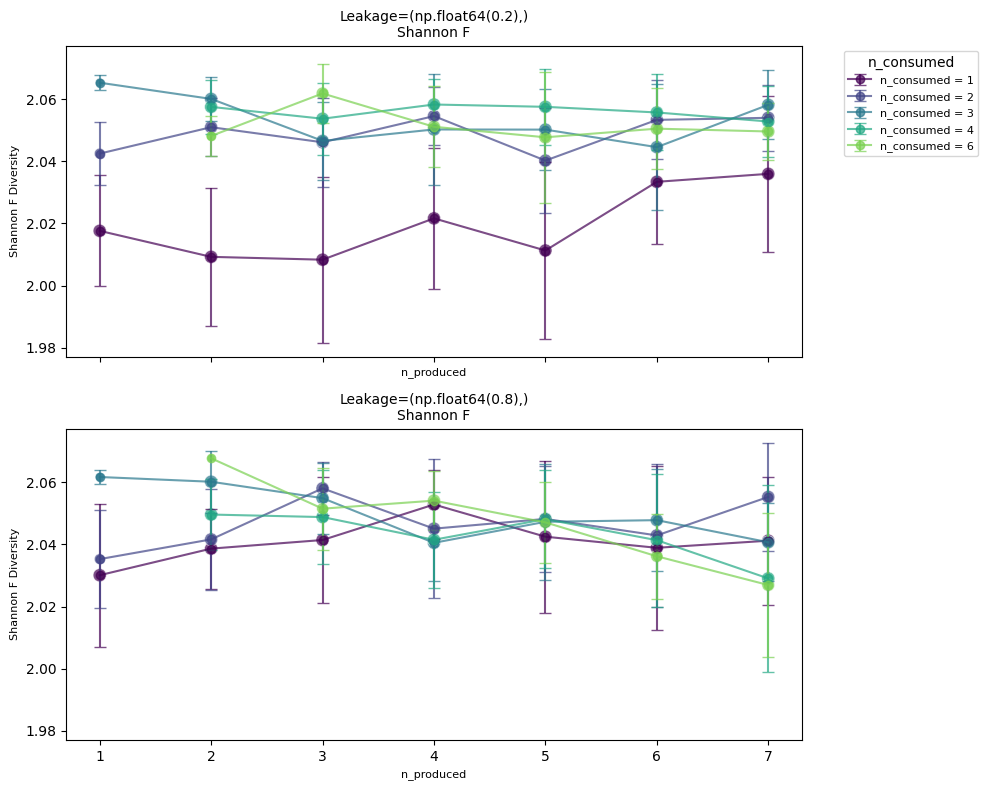

In [10]:
import itertools

# Generate parameter combinations
leakage_values = sampled_data['l'].unique()
combinations = list(itertools.product(leakage_values))

# Set up the figure with 27 subplots (each with 2 panels)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), sharex=True, sharey=True)
axes = axes.flatten()  # Flatten the axes for easier iteration

# Define a discrete version of the 'viridis' colormap with enough distinct colors
n_colors = len(unique_n_consumed)
cmap = plt.cm.viridis  # Use 'viridis' colormap
colors = [cmap(i / n_colors) for i in range(n_colors)]  # Discretize the colormap

# Loop through each parameter combination and create plots
for idx, (leakage) in enumerate(combinations):
    # Filter data for the current combination
    combo_data = sampled_data[
        (sampled_data['l'] == leakage) 
    ]
    
    # Prepare axes for Shannon F and Shannon O
    ax_F = axes[idx]      # First panel for Shannon F
    
    # Loop through each unique 'n_consumed' and plot data for Shannon F and O
    for i, n_cons in enumerate(unique_n_consumed):
        current_data = combo_data[combo_data['n_consumed'] == n_cons]
        grouped_data = current_data.groupby('n_produced').agg(
            shannon_sp_avg=('shannon_F', 'mean'),
            shannon_sp_std=('shannon_F', 'std'),
            count=('shannon_F', 'size')
        ).reset_index()
        
        # Calculate marker sizes
        marker_sizes = np.sqrt(grouped_data['count']) * 30
        
        # Plot Shannon F
        ax_F.errorbar(
            grouped_data['n_produced'], 
            grouped_data['shannon_sp_avg'], 
            yerr=grouped_data['shannon_sp_std'], 
            fmt='-o', color=colors[i], label=f'n_consumed = {n_cons}', alpha=0.7, capsize=4
        )
        ax_F.scatter(
            grouped_data['n_produced'], 
            grouped_data['shannon_sp_avg'], 
            s=marker_sizes, color=colors[i], alpha=0.7, edgecolor='w', linewidth=0.5
        )
        

    # Set titles for the current parameter combination
    ax_F.set_title(f'Leakage={leakage}\nShannon F', fontsize=10)    
    # Set axis labels
    ax_F.set_xlabel('n_produced', fontsize=8)
    ax_F.set_ylabel('Shannon F Diversity', fontsize=8)

# Add a legend to the first panel
axes[0].legend(title="n_consumed", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

# Adjust layout and display
plt.tight_layout()
plt.show()

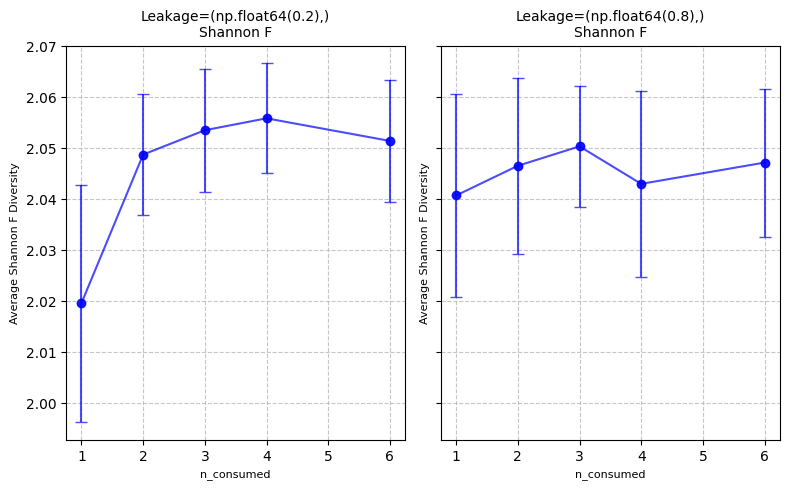

In [11]:
# Exclude rows where n_consumed equals 20
df_check_filtered = sampled_data.copy()

unique_n_consumed = df_check_filtered['n_consumed'].unique()

# Sort the 'n_consumed' values so colors are assigned in increasing order
unique_n_consumed = np.sort(unique_n_consumed)

# Generate parameter combinations
leakage_values = df_check_filtered['l'].unique()
combinations = list(itertools.product(leakage_values))

# Set up the figure with half the columns (no O panels)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 5), sharex=True, sharey=True)
axes = axes.flatten()  # Flatten the axes for easier iteration

# Define a discrete version of the 'viridis' colormap with enough distinct colors
n_colors = len(unique_n_consumed)
cmap = plt.cm.viridis  # Use 'viridis' colormap
colors = [cmap(i / n_colors) for i in range(n_colors)]  # Discretize the colormap

# Loop through each parameter combination and create plots (only for Shannon F)
for idx, (leakage) in enumerate(combinations):
    # Filter data for the current combination from df_check_filtered (Shannon F only)
    combo_data = df_check_filtered[
        (df_check_filtered['l'] == leakage)
    ]
    
    # Prepare axis for Shannon F
    ax_F = axes[idx]  # One panel for Shannon F
    
    # Loop through each unique 'n_consumed' and plot data for Shannon F
    avg_shannon_F = []
    std_shannon_F = []
    for n_cons in unique_n_consumed:
        current_data = combo_data[combo_data['n_consumed'] == n_cons]
        grouped_data = current_data.groupby('n_produced').agg(
            shannon_sp_avg=('shannon_F', 'mean'),
            shannon_sp_std=('shannon_F', 'std')
        ).reset_index()

        # Average over all n_produced values
        avg_shannon_F.append(grouped_data['shannon_sp_avg'].mean())
        std_shannon_F.append(grouped_data['shannon_sp_std'].mean())
    
    # Plot Shannon F
    ax_F.errorbar(
        unique_n_consumed, 
        avg_shannon_F, 
        yerr=std_shannon_F, 
        fmt='-o', color='b', alpha=0.7, capsize=4
    )
    ax_F.scatter(
        unique_n_consumed, 
        avg_shannon_F, 
        s=50, color='b', alpha=0.7, edgecolor='w', linewidth=0.5
    )
    
    # Set title for the current parameter combination
    ax_F.set_title(f'Leakage={leakage}\nShannon F', fontsize=10)
    
    # Set axis labels
    ax_F.set_xlabel('n_consumed', fontsize=8)
    ax_F.set_ylabel('Average Shannon F Diversity', fontsize=8)
    
    # Add grid lines
    ax_F.grid(True, linestyle='--', alpha=0.7)

# Adjust layout and display
plt.tight_layout()
plt.show()

/tmp/ipykernel_958690/2758502219.py:20: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_0_2 = leakage_0_2.groupby(['n_consumed', 'n_produced'], group_keys=False)\
/tmp/ipykernel_958690/2758502219.py:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_0_8 = leakage_0_8.groupby(['n_consumed', 'n_produced'], group_keys=False)\


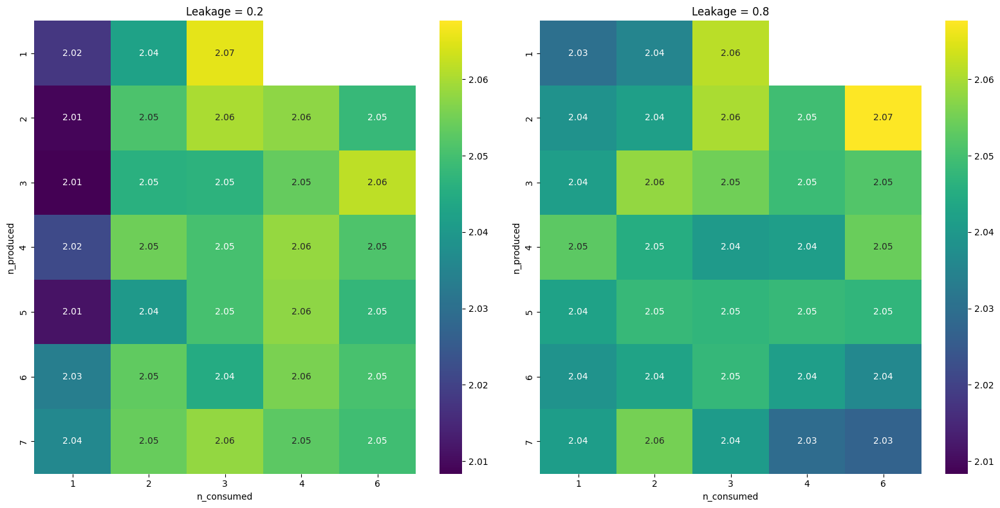

In [12]:
# Copy the DataFrame to avoid SettingWithCopyWarning
df_complete = df_complete.copy()

# Apply function to create 'shannon_F' column
df_complete.loc[:, 'shannon_F'] = df_complete['sh_sp_F'].apply(lambda x: x[-1])

# Separate the data by leakage
leakage_0_2 = df_complete[df_complete['l'] == 0.2]
leakage_0_8 = df_complete[df_complete['l'] == 0.8]

# Define the target size per group
target_size = 300  # Half of 500 networks
unique_combinations = leakage_0_2.groupby(['n_consumed', 'n_produced']).size()

# Calculate the sample size per group
sample_per_group_0_2 = target_size // len(unique_combinations)
sample_per_group_0_8 = target_size // len(unique_combinations)

# Sample data for leakage = 0.2
sampled_0_2 = leakage_0_2.groupby(['n_consumed', 'n_produced'], group_keys=False)\
    .apply(lambda x: x.sample(min(len(x), sample_per_group_0_2), random_state=42))

# Sample data for leakage = 0.8
sampled_0_8 = leakage_0_8.groupby(['n_consumed', 'n_produced'], group_keys=False)\
    .apply(lambda x: x.sample(min(len(x), sample_per_group_0_8), random_state=42))

# Calculate diversity using agg() (mean Shannon entropy)
diversity_0_2 = sampled_0_2.groupby(['n_consumed', 'n_produced'])['shannon_F'].agg('mean').unstack(fill_value=np.nan)
diversity_0_8 = sampled_0_8.groupby(['n_consumed', 'n_produced'])['shannon_F'].agg('mean').unstack(fill_value=np.nan)

# Find global vmin and vmax for both heatmaps
vmin = min(diversity_0_2.min().min(), diversity_0_8.min().min())
vmax = max(diversity_0_2.max().max(), diversity_0_8.max().max())

# Plot the counts as tables
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Table for leakage = 0.2
sns.heatmap(diversity_0_2.T, ax=axes[0], annot=True, fmt='.2f', cmap='viridis', cbar=True, mask=diversity_0_2.T.isna(),
            vmin=vmin, vmax=vmax)
axes[0].set_title('Leakage = 0.2')
axes[0].set_xlabel('n_consumed')
axes[0].set_ylabel('n_produced')

# Table for leakage = 0.8
sns.heatmap(diversity_0_8.T, ax=axes[1], annot=True, fmt='.2f', cmap='viridis', cbar=True, mask=diversity_0_8.T.isna(),
            vmin=vmin, vmax=vmax)
axes[1].set_title('Leakage = 0.8')
axes[1].set_xlabel('n_consumed')
axes[1].set_ylabel('n_produced')

# Adjust layout
plt.tight_layout()
plt.show()